# Testing our Flow module, in 2D

The objective of this notebook is to test flow matching on simple 2D datasets, by testing:
- If the paths, schedulers and sampling works properly
- If the target velocities makes sense
- If we can train a flow model
- If the velocity field for this model makes sense
- If the model samples correctly
- If we can condition the generations using classifier guidance
- If we can condition the generations usign classifier-free guidance

In [1]:
# Navigate to the root of the project and import necessary libraries
from hydra import initialize, compose
initialize(config_path="../confs", job_name="notebook")

import sys
import os
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

sys.path.append(os.path.abspath("../src"))
# We change the working directory to the root of the project
# Run this only once
root_path = Path.cwd().parent
os.chdir(root_path)
sys.path.append(root_path / "src")

/tmp/ipykernel_39680/1263814139.py:3: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  initialize(config_path="../confs", job_name="notebook")


## Loading the dataset

In [2]:
from experiments.datasets.datasets import GMM2GMM, get_first_example_dataset, get_second_example_dataset
from torch.utils.data import DataLoader

# First example: GMM with 2 components -> GMM with 3 components
# Second example: Gaussian -> GMM with 5 components

n_points = 2000000

# dataset = get_first_example_dataset(n_points)
dataset = get_second_example_dataset(n_points)
loader = DataLoader(dataset, batch_size=512, shuffle=True)

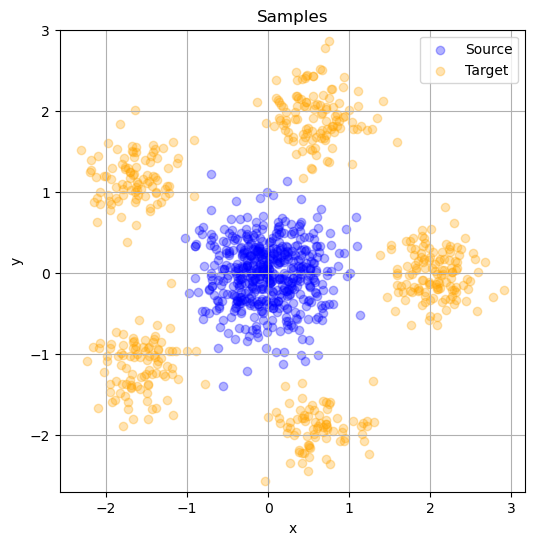

In [3]:
# Let's visualize the first batch
from src.experiments.visualization.plots import *
batch = next(iter(loader))
x0, x1, y = batch
scatter_points(x0, x1)

## Let's load a toy flow model:

We use **Hydra** to specify our models in ```.yaml``` configuration files, to simplify the loading process, experiments, and configuration management:

In [4]:

from hydra.utils import instantiate
from omegaconf import OmegaConf
from src.flows.types import Predicts
os.environ["HYDRA_FULL_ERROR"] = "1"

cfg = compose(config_name="flow_model/toy_flow")
flow_model = instantiate(cfg.flow_model)

/home/mathis/anaconda3/lib/python3.12/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'flow_model/toy_flow': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)
/home/mathis/Bureau/Stage - Code/StageTests/src/flows/snr_sampler.py:15: SyntaxWarning: invalid escape sequence '\i'
  """
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/utilities/parsing.py:209: Attribute 'path' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['path'])`.


Here is how a configuration file for a Flow is usually structured.

```_target_``` points to an object that we would like to instanciate. One of the main strengths of **Hydra** is that we can make our configurations inherit from sub-configurations defined in other files and define defaults for the values. Moreover, these ```.yaml``` configuration files are convenient because they are easy to export and therefore convenient for logging experiments.


Note that it is important to have ```_partial_=True``` for the ```optimizer_cfg``` and the ```scheduler_cfg``` when specified.

In [5]:
# import the function to display markdown
from IPython.display import display, Markdown

# Display the model configuration
display(Markdown(f"```yaml\n{OmegaConf.to_yaml(cfg)}\n```"))

```yaml
flow_model:
  _target_: src.flows.flow.Flow
  path:
    _target_: src.flows.path.AffinePath
    tol: 0.0003
    t_law:
      _target_: src.flows.snr_sampler.LogitNormal
      loc: 0.0
      scale: 1.0
    scheduler:
      _target_: src.flows.schedulers.OTScheduler
  loss_fn:
    _target_: src.flows.losses.MSEFlowMatchingLoss
  cfg:
    _target_: src.flows.types.FlowConfig
    predicts: velocity
  solver_cfg:
    method: midpoint
    options:
      step_size: 0.01
  optimizer_cfg:
    _target_: torch.optim.Adam
    _partial_: true
    lr: 0.0003
  model:
    _target_: src.experiments.models.models.TimeConditionedMLP
    x_dim: 2
    output_dim: 2
    num_fourier_bands: 4
    hidden_dim: 64
    n_layers: 4

```

## Sampling points and their target velocities

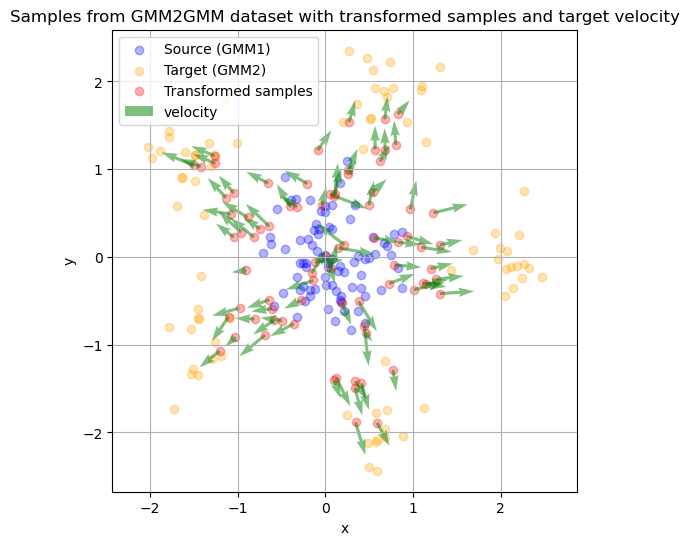

In [6]:
loader = DataLoader(dataset, batch_size=80, shuffle=True)
x0, x1, y = next(iter(loader))

t, x_t = flow_model.path.sample(x_0=x0, x_1=x1)
target_vectors = flow_model.path.target_velocity(t, x0, x1)
scatter_points_with_velocity(x0, x1, x_t, target_vectors)

## Training a model

For training models, we resort to PyTorch-Lightning, which fully automates the training loop. This module is very powerful, as it supports many options, such as:
* Integrated loggers (TensorBoard, w&b, ...) for training and validation stats
* Multi-device training, without changing your code
* Auto-Tuning of hyperparameters
* Callbacks to custom functions
* Mixed precision
* Unit Tests
* Gradient clipping / Gradient accumulation to simulate larger batches
* Model checkpoints
* ...

So let's load our Trainer class:

In [7]:
trainer_cfg = compose(config_name="trainer/toy_trainer")

# Display the trainer configuration
display(Markdown(f"```yaml\n{OmegaConf.to_yaml(trainer_cfg)}\n```"))

trainer = instantiate(trainer_cfg.trainer)

/home/mathis/anaconda3/lib/python3.12/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'trainer/toy_trainer': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)


```yaml
trainer:
  _target_: pytorch_lightning.Trainer
  log_every_n_steps: 10
  num_sanity_val_steps: 2
  check_val_every_n_epoch: 1
  accelerator: gpu
  devices: 1
  callbacks:
  - _target_: pytorch_lightning.callbacks.TQDMProgressBar
    refresh_rate: 100
    leave: true
  max_epochs: 3

```

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/trainer/connectors/logger_connector/logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default


And now, we fit our model:

In [8]:
import logging
logging.basicConfig(level=logging.INFO)

loader = DataLoader(dataset, batch_size=5000, shuffle=True)

# train the model
trainer.fit(flow_model, train_dataloaders=loader)

/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/trainer/configuration_validator.py:70: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type               | Params | Mode 
-----------------------------------------------------
0 | path  | AffinePath         | 0      | train
1 | model | TimeConditionedMLP | 13.3 K | train
-----------------------------------------------------
13.3 K    Trainable params
0         Non-trainable params
13.3 K    Total params
0.053     Total estimated model params size (MB)
13        Modules in train mode
0         Modules in eval mode
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=3` reached.


## Estimated velocities $u^\theta_t(x_t)$

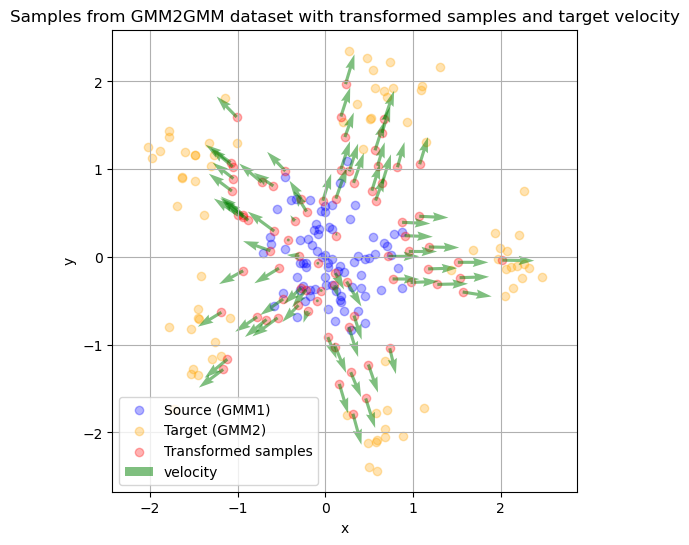

In [9]:
flow_model.eval()
flow_model.path.eval()

t, x_t= flow_model.path.sample(x_0=x0, x_1=x1)
# get u_theta(t, x_t)
v = flow_model.estimated_velocity(t, x_t).detach()

scatter_points_with_velocity(x0, x1, x_t, v)

In [10]:
import torch

def estimate_score(t, x_t):
    if (t==0).any() or (t>1-2e-2).any():
        return torch.zeros_like(x_t)+0.1
    score= flow_model.predict_score(t, x_t)
    normalized_score = score / (torch.norm(score, dim=1, keepdim=True)).max() * 2
    return normalized_score


def estimate_velocity(t, x_t, norm = True):
    v = flow_model.estimated_velocity(t, x_t)
    return v / torch.norm(v, dim=1, keepdim=True).max() if norm else v

ani = animate_estimated_velocity(x0, x1, estimate_velocity, device='cpu', N_t=100)
HTML(ani.to_jshtml())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


## Analyze the trajectories

In [11]:
animate_sampled_trajectories(
    flow_model,
    dataset,
    samples=500,
)

Path length: 774.9888


INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


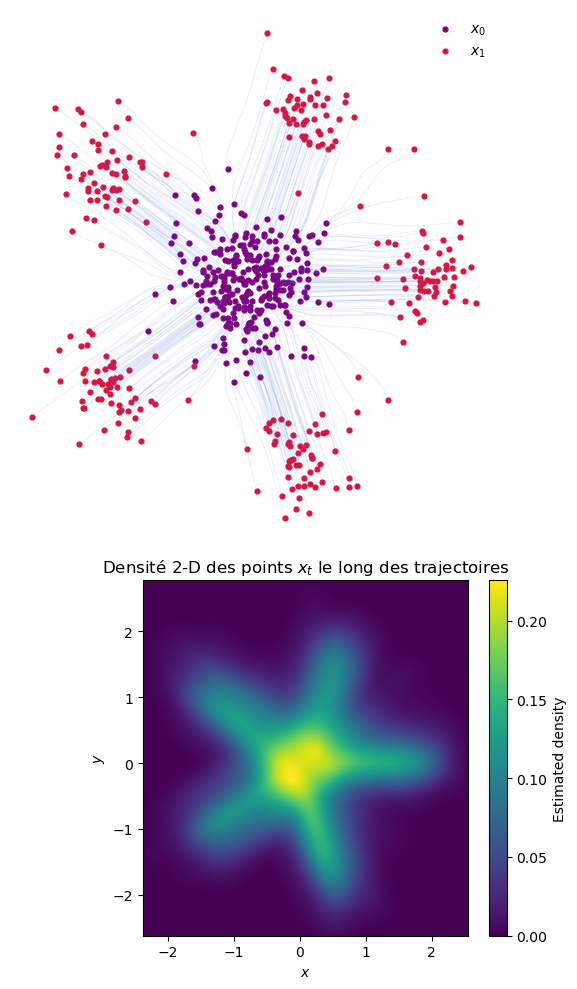

In [12]:
_ = plot_trajectories_with_density(
    flow_model=flow_model,
    loader=loader,
    N=300
)

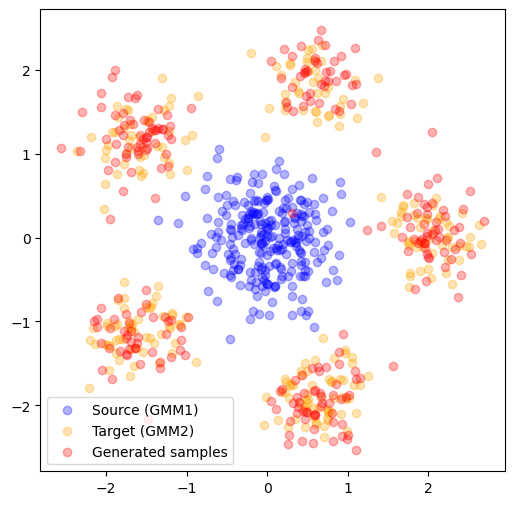

In [13]:
loader = DataLoader(dataset, batch_size=256, shuffle=True)
x0, x1, y = next(iter(loader))
gen = flow_model.sample(x0)
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

plt.scatter(gen[:, 0], gen[:, 1], color='red', alpha=0.3, label='Generated samples')
plt.legend()



## Classifier Guidance

We begin by training a classifier.

Epoch 0: loss = 1.5847408771514893
Epoch 10: loss = 1.3206816911697388
Epoch 20: loss = 1.0561305284500122
Epoch 30: loss = 0.777274489402771
Epoch 40: loss = 0.5364047884941101
Epoch 50: loss = 0.3720322549343109
Epoch 60: loss = 0.2409111112356186
Epoch 70: loss = 0.15415151417255402
Epoch 80: loss = 0.10203460603952408
Epoch 90: loss = 0.07389304041862488


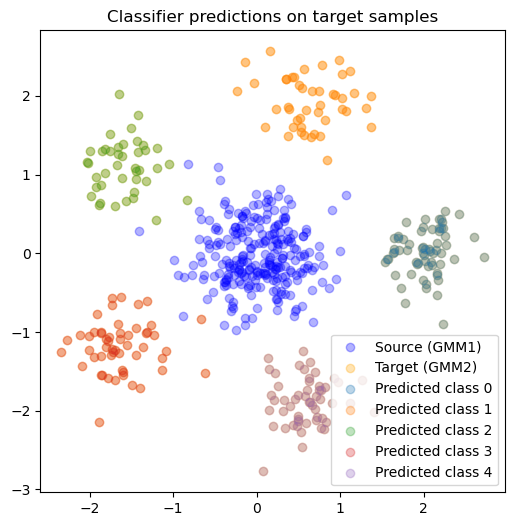

In [14]:
# train a classifier
import torch.nn as nn
from experiments.models.models import create_MLP

classifier = create_MLP(2, 5, 64, 2)

epochs = 100
lr = 1e-3

optimizer = torch.optim.Adam(classifier.parameters(), lr=lr)
criterion = nn.CrossEntropyLoss()

classifier.train()
for i in range(epochs):
    optimizer.zero_grad()
    x0, x1, y = next(iter(loader))
    
    preds = classifier(x1)
    loss = criterion(preds, y)
    loss.backward()
    optimizer.step()

    if i % 10 == 0:
        print(f"Epoch {i}: loss = {loss.item()}")

classifier.eval()
x0, x1, y = next(iter(loader))
preds = classifier(x1)
preds = torch.argmax(preds, dim=1)
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

for i in range(5):
    plt.scatter(x1[preds == i][:, 0], x1[preds == i][:, 1], alpha=0.3, label=f'Predicted class {i}')

plt.legend()
plt.title("Classifier predictions on target samples")
plt.show()


Then, we instanciate the right flow model and passes the right model to it

In [15]:
model_cls = compose(config_name="flow_model/toy_flow_cls")
model_cls.flow_model.cfg.guidance_scale = 0.1


flow_model_cls = instantiate(model_cls.flow_model, classifier=classifier, model=flow_model.model)

/home/mathis/anaconda3/lib/python3.12/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'flow_model/toy_flow_cls': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/utilities/parsing.py:209: Attribute 'path' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['path'])`.


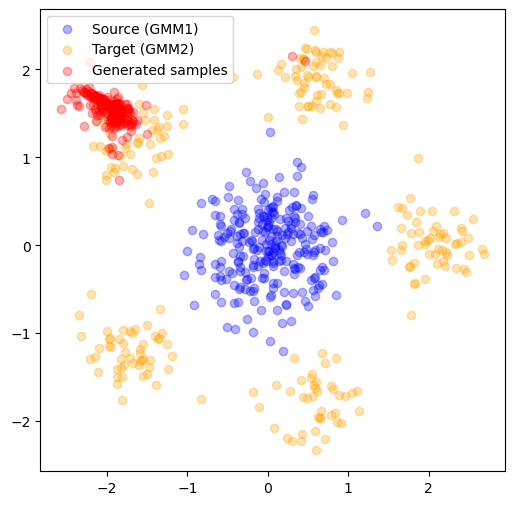

In [16]:

loader = DataLoader(dataset, batch_size=256, shuffle=True)
x0, x1, y = next(iter(loader))

y = torch.ones(x0.shape[0], dtype=torch.long) * 2


gen = flow_model_cls.sample(x0, y=y)
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

plt.scatter(gen[:, 0], gen[:, 1], color='red', alpha=0.3, label='Generated samples')
plt.legend()



**Note**: The results of the classifier guidance are not that great. This is to be expected, as the gradients in the early step of the flow, when $t<<1$, are quite unreliable. Indeed, the classifier is not really trained for points from the initial distribution. It's a bit like following of the gradients for some classification task, except the images are pure noise. This is why, in this case, classifier-free guidance is a more adequate choice for guidance.

In [17]:
animate_sampled_trajectories(
    flow_model_cls,
    dataset,
    samples=500,
    y=0
)

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


Path length: 1171.8949


## Classifier-Free Guidance (CFG)

In [18]:
model_cfg = compose(config_name="flow_model/toy_flow_cfg")
display(Markdown(f"```yaml\n{OmegaConf.to_yaml(model_cfg)}\n```"))
model_cfg.flow_model.cfg.guidance_scale = 1

flow_model_cfg = instantiate(model_cfg.flow_model)

trainer = instantiate(trainer_cfg.trainer)
trainer.fit(flow_model_cfg, train_dataloaders=loader)


/home/mathis/anaconda3/lib/python3.12/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'flow_model/toy_flow_cfg': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)


```yaml
flow_model:
  _target_: src.flows.flow.Flow
  path:
    _target_: src.flows.path.AffinePath
    tol: 0.0003
    t_law:
      _target_: src.flows.snr_sampler.LogitNormal
      loc: 0.0
      scale: 1.0
    scheduler:
      _target_: src.flows.schedulers.OTScheduler
  loss_fn:
    _target_: src.flows.losses.MSEFlowMatchingLoss
  cfg:
    _target_: src.flows.types.FlowConfig
    predicts: velocity
    guidance: CFG
    guidance_scale: 1.0
    guided_prob: 0.5
  solver_cfg:
    method: midpoint
    options:
      step_size: 0.01
  optimizer_cfg:
    _target_: torch.optim.Adam
    _partial_: true
    lr: 0.0003
  model:
    _target_: src.experiments.models.models.TimeAndLabelConditionedMLP
    x_dim: 2
    output_dim: 2
    num_fourier_bands: 4
    hidden_dim: 64
    n_layers: 3
    num_classes: 5
    y_emb_dim: 16

```

/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/utilities/parsing.py:209: Attribute 'path' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['path'])`.
Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/trainer/configuration_validator.py:70: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                       | Params | Mode 
-------------------------------------------------------------
0 | path  | AffinePath                 | 0      | train
1 | model | TimeAndLabelConditionedMLP | 10.3 K 

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=3` reached.


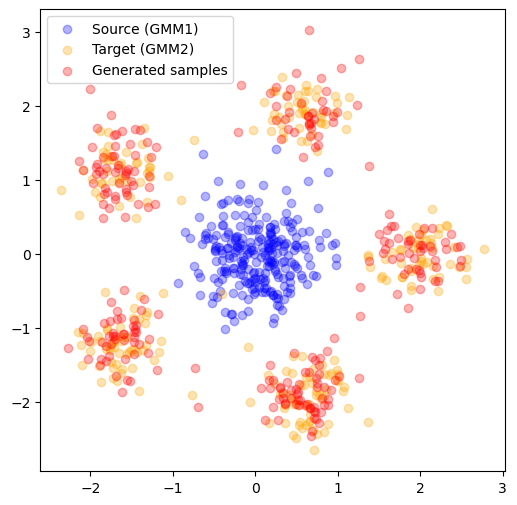

In [19]:
loader = DataLoader(dataset, batch_size=256, shuffle=True)
x0, x1, y = next(iter(loader))

y = torch.ones(x0.shape[0], dtype=torch.long) * 2


gen = flow_model_cfg.sample(x0)
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

plt.scatter(gen[:, 0], gen[:, 1], color='red', alpha=0.3, label='Generated samples')
plt.legend()



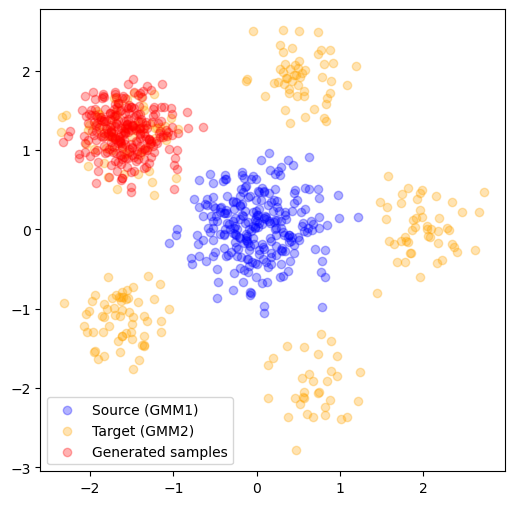

In [20]:
loader = DataLoader(dataset, batch_size=256, shuffle=True)
x0, x1, y = next(iter(loader))

y = torch.ones(x0.shape[0], dtype=torch.long) * 2


gen = flow_model_cfg.sample(x0, y=y)
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

plt.scatter(gen[:, 0], gen[:, 1], color='red', alpha=0.3, label='Generated samples')
plt.legend()



In [21]:
animate_sampled_trajectories(
    flow_model_cfg,
    dataset,
    samples=500,
    y=0
)

Path length: 1007.5159


INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


# ReFlow and path straigthening

ReFlow, by Liu et Al., is a paper published in 2022 that introduced many contributions to flow models. They are one of the first papers to analyze the mathematical properties of flow models, and introduced an algorithm to straighten the interpolants, allowing for coarser discretization and optimal transport.

See the Rectified Flow paper for more information: [arxiv link](https://arxiv.org/pdf/2209.03003)

/home/mathis/anaconda3/lib/python3.12/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'flow_model/toy_flow': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/utilities/parsing.py:209: Attribute 'path' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['path'])`.
Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/mathis/anaconda3/lib/python3.12/site-packages/pytorch_lightning/trainer/configuration_validator.py:70: You defined a `validation_step` but have no `val_da

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=3` reached.


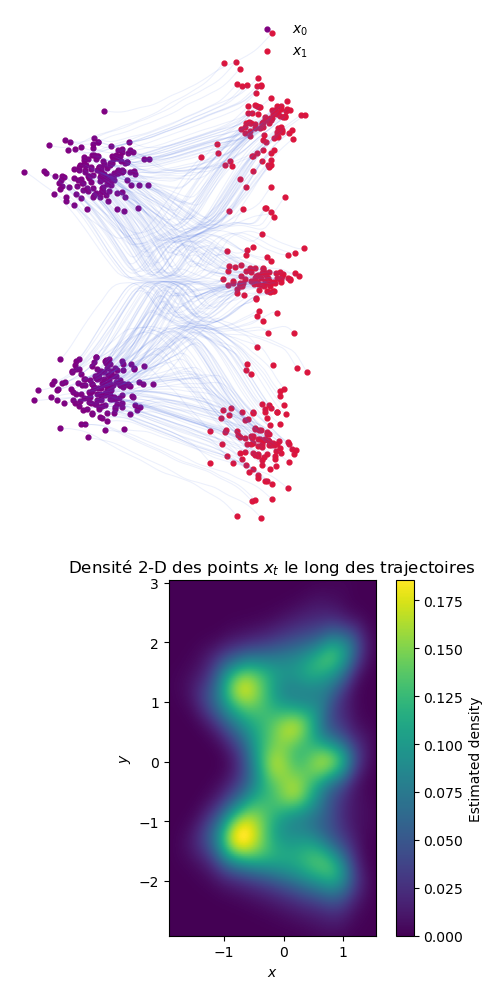

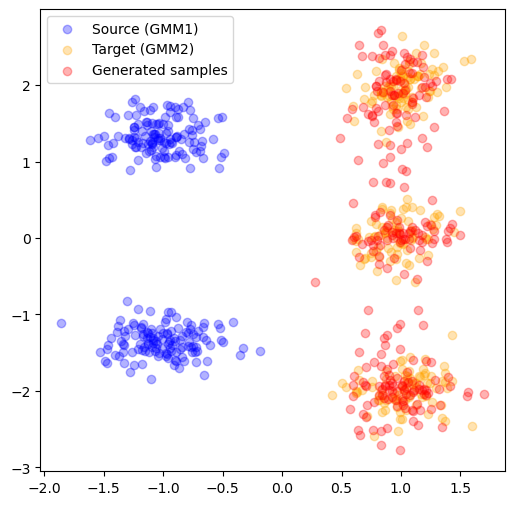

In [22]:

# Load the dataset
n_points = 3000000

dataset = get_first_example_dataset(n_points)
# dataset = get_second_example_dataset(n_points)
loader = DataLoader(dataset, batch_size=5120, shuffle=True)

# Load and train the flow model
cfg = compose(config_name="flow_model/toy_flow")
flow_model = instantiate(cfg.flow_model)

trainer = instantiate(trainer_cfg.trainer)
trainer.fit(flow_model, train_dataloaders=loader)

# Visualize the trajectories
_ = plot_trajectories_with_density(
    flow_model=flow_model,
    loader=loader,
    N=300
)

loader = DataLoader(dataset, batch_size=256, shuffle=True)
x0, x1, y = next(iter(loader))

y = torch.ones(x0.shape[0], dtype=torch.long) * 2


gen = flow_model.sample(x0)
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

plt.scatter(gen[:, 0], gen[:, 1], color='red', alpha=0.3, label='Generated samples')
plt.legend()
plt.show()


In [23]:
trainer_cfg.trainer.max_epochs=1

In [ ]:
from src.flows.reflow import get_reflow_collate_fn, get_reflow_stack_collate_fn

z1_loader = DataLoader(dataset, batch_size=512, shuffle=True, collate_fn=get_reflow_collate_fn(flow_model=flow_model))

cfg = compose(config_name="flow_model/toy_flow")
flow_model_2 = instantiate(cfg.flow_model)
trainer = instantiate(trainer_cfg.trainer)
trainer.fit(flow_model_2, train_dataloaders=z1_loader)

# Visualize the trajectories
_ = plot_trajectories_with_density(
    flow_model=flow_model_2,
    loader=z1_loader,
    N=300
)

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type               | Params | Mode 
-----------------------------------------------------
0 | path  | AffinePath         | 0      | train
1 | model | TimeConditionedMLP | 13.3 K | train
-----------------------------------------------------
13.3 K    Trainable params
0         Non-trainable params
13.3 K    Total params
0.053     Total estimated model params size (MB)
13        Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

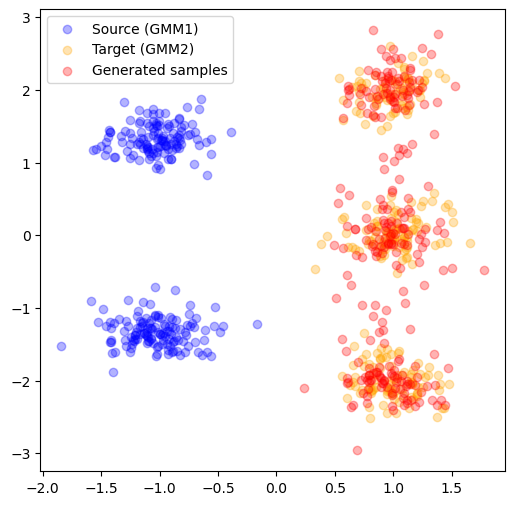

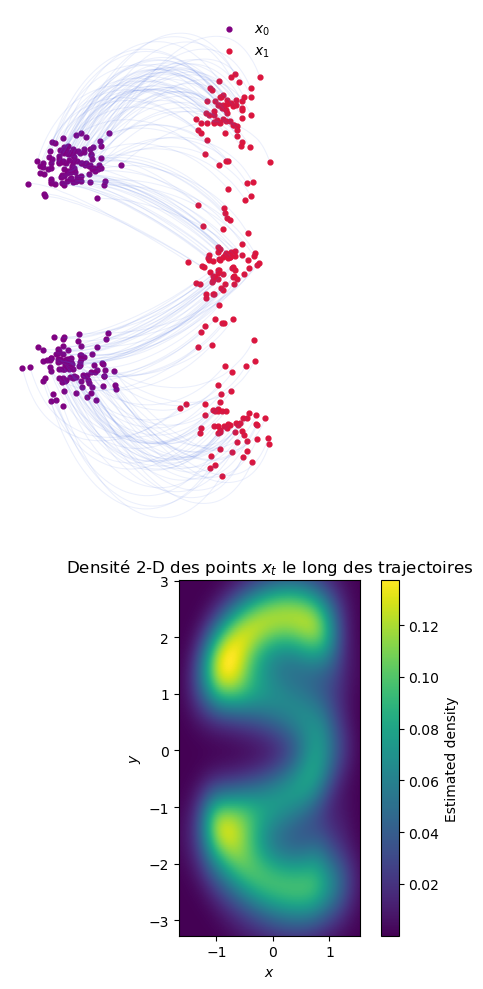

In [ ]:

loader = DataLoader(dataset, batch_size=256, shuffle=True)
x0, x1, y = next(iter(loader))

y = torch.ones(x0.shape[0], dtype=torch.long) * 2



gen = flow_model.sample(x0)
plt.figure(figsize=(6, 6))
plt.scatter(x0[:, 0], x0[:, 1], color='blue', alpha=0.3, label='Source (GMM1)')
plt.scatter(x1[:, 0], x1[:, 1], color='orange', alpha=0.3, label='Target (GMM2)')

plt.scatter(gen[:, 0], gen[:, 1], color='red', alpha=0.3, label='Generated samples')
plt.legend()
plt.show()

_ = plot_trajectories_with_density(
    flow_model=flow_model_2,
    loader=loader,
    N=200
)